# Introduction


Ocular Disease Recognition dataset

* Normal (N);  
* Diabetes (D);  
* Glaucoma (G);  
* Cataract (C);  
* AMD (A);  
* Hypertension (H);  
* Myopia (M);
* Other diseases/abnormalities (O)  


This project focuses on Cataract.


# Data Preprocessing

In [ ]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

Mounted at /content/drive/


In [ ]:
import numpy as np
import pandas as pd
import os
import glob
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
IMG_SIZE = 224
BATCH_SIZE = 32
NO_EPOCHS = 50
NUM_CLASSES = 2
DATA_FOLDER = "/content/drive/MyDrive/Ocular Disease Recognition/ODIR-5K/Training Images"
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tqdm import tqdm
import cv2 as cv
from random import shuffle
from IPython.display import SVG
from tensorflow.keras.utils import model_to_dot
from tensorflow.keras.utils import plot_model

from tensorflow.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten, GlobalAveragePooling2D
# import tensorflow_addons as tfa
import tensorflow as tf
%matplotlib inline

In [ ]:
data_df = pd.read_excel(open("/content/drive/MyDrive/Ocular Disease Recognition/ODIR-5K/data.xlsx", 'rb'), sheet_name='Sheet1')

In [ ]:
data_df.columns = ["id", 'age', "sex", "left_fundus", "right_fundus", "left_diagnosys", "right_diagnosys", "normal",
                  "diabetes", "glaucoma", "cataract", "amd", "hypertension", "myopia", "other"]

In [ ]:
data_df

,id,age,sex,left_fundus,right_fundus,left_diagnosys,right_diagnosys,normal,diabetes,glaucoma,cataract,amd,hypertension,myopia,other
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1
3,3,66,Male,3_left.jpg,3_right.jpg,normal fundus,branch retinal artery occlusion,0,0,0,0,0,0,0,1
4,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,4686,63,Male,4686_left.jpg,4686_right.jpg,severe nonproliferative retinopathy,proliferative diabetic retinopathy,0,1,0,0,0,0,0,0
3496,4688,42,Male,4688_left.jpg,4688_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0
3497,4689,54,Male,4689_left.jpg,4689_right.jpg,mild nonproliferative retinopathy,normal fundus,0,1,0,0,0,0,0,0
3498,4690,57,Male,4690_left.jpg,4690_right.jpg,mild nonproliferative retinopathy,mild nonproliferative retinopathy,0,1,0,0,0,0,0,0


In [ ]:
path = '/content/drive/MyDrive/Ocular Disease Recognition/preprocessed_images/'

In [ ]:
data_df['left_fundus'][0]

'0_left.jpg'

In [ ]:
path+data_df['left_fundus'][0]

'/content/drive/MyDrive/Ocular Disease Recognition/preprocessed_images/0_left.jpg'

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

img = tf.keras.preprocessing.image.load_img(path+data_df['left_fundus'][0])
img_array = tf.keras.preprocessing.image.img_to_array(img)

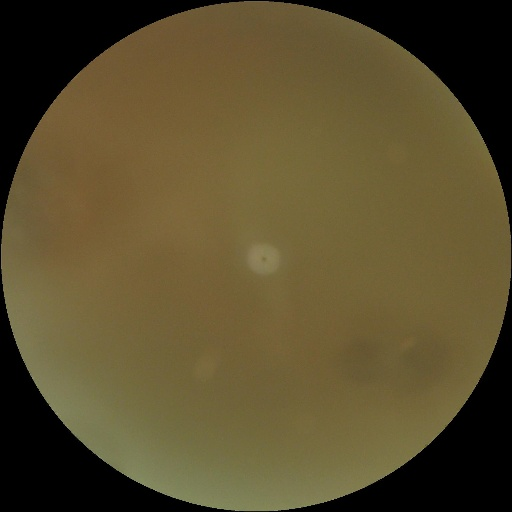

In [ ]:
img

## Reference Paper: https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=10166032

2. https://www.sciencedirect.com/science/article/pii/S1746809420304432

## inceptv3

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

In [ ]:
# import os
# import pandas as pd
# import numpy as np
# import tensorflow as tf

# path = '/content/drive/MyDrive/Ocular Disease Recognition/preprocessed_images/'
# metadata_df = data_df

# def load_and_organize_data(image_path, metadata_df):
#     image_data = []
#     labels = []

#     for index, row in metadata_df.iterrows():
#         left_image_path = os.path.join(image_path, row['left_fundus'])
#         right_image_path = os.path.join(image_path, row['right_fundus'])

#         if os.path.exists(left_image_path) and os.path.exists(right_image_path):
#             # Load and preprocess left and right fundus images
#             left_img = tf.keras.preprocessing.image.load_img(left_image_path, target_size=(224, 224))
#             right_img = tf.keras.preprocessing.image.load_img(right_image_path, target_size=(224, 224))

#             left_img_array = tf.keras.preprocessing.image.img_to_array(left_img) / 255.0
#             right_img_array = tf.keras.preprocessing.image.img_to_array(right_img) / 255.0

#             # Combine the images (average)
#             combined_image = (left_img_array + right_img_array) / 2

#             image_data.append(combined_image)

#             # Collect labels for multi-label classification
#             labels.append([row['normal'], row['diabetes'], row['glaucoma'], row['cataract'],
#                            row['amd'], row['hypertension'], row['myopia'], row['other']])

#     image_data = np.array(image_data)
#     labels = np.array(labels)

#     return image_data, labels


In [ ]:
import cv2

def process_row_opencv(row, image_path):
    left_image_path = os.path.join(image_path, row['left_fundus'])
    right_image_path = os.path.join(image_path, row['right_fundus'])

    if os.path.exists(left_image_path) and os.path.exists(right_image_path):
        try:
            # Load images with OpenCV (BGR format)
            left_img = cv2.imread(left_image_path)
            right_img = cv2.imread(right_image_path)

            if left_img is None or right_img is None:
                print(f"Failed to read images for row {row.name}")
                return None

            # Resize images
            left_img = cv2.resize(left_img, (224, 224))
            right_img = cv2.resize(right_img, (224, 224))

            # Convert BGR to RGB
            left_img = cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB)
            right_img = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)

            # Normalize
            left_img_array = left_img.astype('float32') / 255.0
            right_img_array = right_img.astype('float32') / 255.0

            # Combine the images (average)
            combined_image = (left_img_array + right_img_array) / 2

            # Collect labels
            labels = [row['normal'], row['glaucoma'], row['cataract'],
                       row['hypertension'], row['myopia']]

            return combined_image, labels
        except Exception as e:
            print(f"Error processing row {row.name}: {e}")
            return None
    else:
        print(f"Images not found for row {row.name}: {left_image_path}, {right_image_path}")
        return None
def load_and_organize_data_parallel_opencv(image_path, metadata_df, num_workers=8):
    # Filter rows where both images exist
    valid_df = metadata_df[
        metadata_df.apply(lambda row: os.path.exists(os.path.join(image_path, row['left_fundus'])) and
                                     os.path.exists(os.path.join(image_path, row['right_fundus'])), axis=1)
    ]

    print(f"Number of valid image pairs: {len(valid_df)}")

    with Pool(num_workers) as pool:
        func = partial(process_row_opencv, image_path=image_path)
        results = pool.map(func, [row for _, row in valid_df.iterrows()])

    # Filter out None results
    results = [res for res in results if res is not None]

    if results:
        image_data, labels = zip(*results)
        return np.array(image_data), np.array(labels)
    else:
        return np.array([]), np.array([])


In [ ]:
from multiprocessing import Pool  # Add this import
from functools import partial  # If you are using partial functions
import pandas as pd  # Assuming you are working with DataFrames

image_data, labels = load_and_organize_data_parallel_opencv(path, data_df)
print(f"Image data shape: {image_data.shape}")
print(f"Labels shape: {labels.shape}")


Number of valid image pairs: 3034
Image data shape: (3034, 224, 224, 3)
Labels shape: (3034, 5)


In [ ]:
# image_data, labels = load_and_organize_data(path, data_df)

# image_data, labels = load_and_organize_data_parallel(image_path, data_df.iloc[:100,:])

In [ ]:
image_data.shape

(3034, 224, 224, 3)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)



In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import tensorflow as tf



base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling to reduce dimensions
x = Dense(1024, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout for regularization
output_layer = Dense(labels.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the base model layers (transfer learning)
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Define training parameters
batch_size = 32
epochs = 50

# Fit the model
history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    batch_size=batch_size,
                    epochs=epochs)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, batch_size=batch_size)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Epoch 1/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 42s 342ms/step - accuracy: 0.7364 - loss: 0.3756 - val_accuracy: 0.8303 - val_loss: 0.2379
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - accuracy: 0.7955 - loss: 0.2422 - val_accuracy: 0.8435 - val_loss: 0.2302
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.8166 - loss: 0.2336 - val_accuracy: 0.8534 - val_loss: 0.2251
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.8304 - loss: 0.2261 - val_accuracy: 0.8501 - val_loss: 0.2204
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.8293 - loss: 0.2127 - val_accuracy: 0.8583 - val_loss: 0.2246
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - accuracy: 0.8398 - loss: 0.2183 - val_accuracy: 0.8550 - val_loss: 0.2237
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - accuracy: 0.8343 - loss: 0.2063 - val_accuracy: 0.8534 - val_loss: 0.2169
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accur

In [37]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 28,112,689 (107.24 MB)

 Trainable params: 2,103,301 (8.02 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

 Optimizer params: 4,206,604 (16.05 MB)

In [43]:
import plotly.graph_objects as go
import numpy as np

def plot_model_confidence_plotly(model, X_test, y_test, class_labels):
    # Get predictions
    predictions = model.predict(X_test)

    # Create traces for each class
    fig = go.Figure()
    for i, class_label in enumerate(class_labels):
        class_probs = predictions[:, i]
        fig.add_trace(go.Histogram(
            x=class_probs,
            name=f'{class_label}',
            opacity=0.6
        ))

    # Update layout for better visualization
    fig.update_layout(
        title="Distribution of Model Confidence for Each Category",
        xaxis_title="Prediction Confidence",
        yaxis_title="Frequency",
        barmode="overlay",  # Overlapping histograms
        legend=dict(title="Categories"),
    )
    fig.update_traces(opacity=0.6)  # Set transparency for overlapping

    # Show the plot
    fig.show()

# Example usage
class_labels = ["normal", "glaucoma", "cataract", "hypertension", "myopia"]
plot_model_confidence_plotly(model, X_test, y_test, class_labels)


19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step


76/76 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step


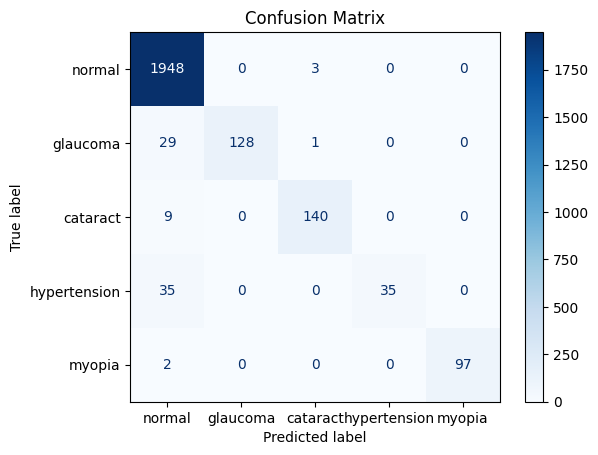

In [46]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(model, X_test, y_test, class_labels, threshold=0.5):
    # Get model predictions
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > threshold).astype(int)  # Convert probabilities to binary predictions

    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))

    # Display confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(cmap="Blues", values_format='d')
    plt.title("Confusion Matrix")
    plt.show()

# Example usage
class_labels = ["normal", "glaucoma", "cataract", "hypertension", "myopia"]
plot_confusion_matrix(model, X_train, y_train, class_labels)


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.inception_v3 import preprocess_input

def get_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Create a model to map the input to the activations and output
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Forward pass through the grad model
        last_conv_layer_output, preds = grad_model(img_array)

        if pred_index is None:
            pred_index = tf.argmax(preds[0])  # Use the predicted class by default

        class_channel = preds[:, pred_index]

    # Compute the gradients of the target class w.r.t. the last conv layer output
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Compute the mean intensity of the gradients across the channels
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight the channels of the feature map by the gradients
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = tf.reduce_sum(last_conv_layer_output * pooled_grads, axis=-1)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam_grid(directory_path, model, last_conv_layer_name='mixed10', class_labels=None):
    # Get all image paths from the directory
    all_images = [os.path.join(directory_path, fname) for fname in os.listdir(directory_path) if fname.endswith(('.jpg', '.jpeg', '.png'))]

    if len(all_images) < 100:
        raise ValueError("Not enough images in the directory to sample 9 for the grid.")

    image_paths = random.sample(all_images, 100)
    plt.figure(figsize=(25, 25))

    for i, img_path in enumerate(image_paths):
        img_name = os.path.basename(img_path)

        # Load and preprocess the image
        img = load_img(img_path, target_size=(224, 224))
        img_array = np.expand_dims(img_to_array(img), axis=0)
        img_array = preprocess_input(img_array)

        # Generate Grad-CAM heatmap
        heatmap = get_gradcam_heatmap(img_array, model, last_conv_layer_name)

        # Predict the class
        preds = model.predict(img_array)
        pred_class = class_labels[np.argmax(preds[0])] if class_labels else f"Class {np.argmax(preds[0])}"

        # Load original image for overlay
        original_img = cv2.imread(img_path)
        original_img = cv2.resize(original_img, (224, 224))

        # Resize and apply heatmap
        heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
        heatmap_resized = np.uint8(255 * heatmap_resized)
        heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

        # Superimpose the heatmap on the original image
        superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)

        # Display the Grad-CAM result
        plt.subplot(10, 10, i + 1)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"{img_name}\nPred: {pred_class}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()



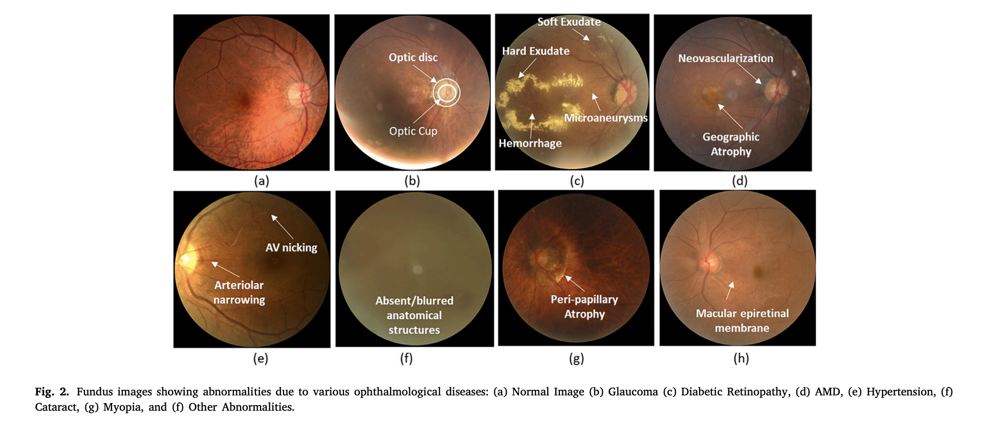

In [35]:
import cv2
from google.colab.patches import cv2_imshow

# Specify the path to your image
image_path = '/content/drive/MyDrive/Ocular Disease Recognition/SampleImage.png'

# Read and display the image
image = cv2.imread(image_path)
cv2_imshow(image)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

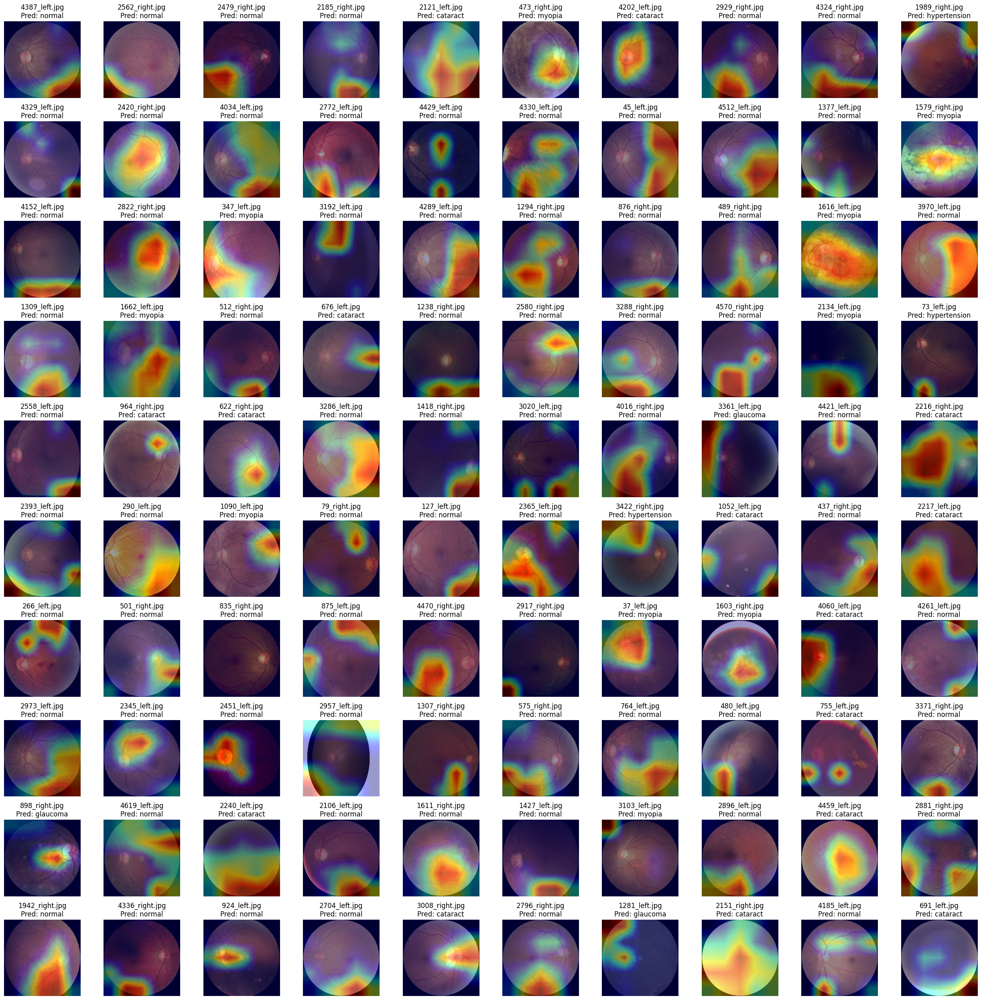

In [ ]:
class_labels = ["normal", "glaucoma", "cataract","hypertension", "myopia"]
display_gradcam_grid(path, model, last_conv_layer_name='mixed10', class_labels=class_labels)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 18.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=82c134fe87030b887a1fed75f453cd887a443bbe7cbf13b5dbc14800bb6be782
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━

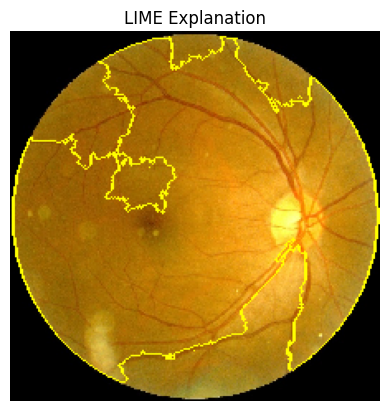

In [39]:
!pip install lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import numpy as np
import matplotlib.pyplot as plt

# Instantiate LIME explainer
explainer = lime_image.LimeImageExplainer()

# Function to preprocess image
def preprocess_image(img_path, model_input_shape=(224, 224)):
    from tensorflow.keras.preprocessing.image import load_img, img_to_array
    from tensorflow.keras.applications.inception_v3 import preprocess_input
    img = load_img(img_path, target_size=model_input_shape)
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)
    return np.expand_dims(img_array, axis=0)

# Preprocess a test image
test_image_path = path + '/' + '9_right.jpg'
test_image = preprocess_image(test_image_path)

# Explain the prediction
explanation = explainer.explain_instance(
    test_image[0].astype('double'),  # Input image
    model.predict,  # Model's prediction function
    top_labels=1,  # Number of top labels to explain
    hide_color=0,  # Mask color
    num_samples=1000  # Number of perturbations
)

# Display the explanation
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=10,
    hide_rest=False
)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.axis('off')
plt.title("LIME Explanation")
plt.show()


In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import tensorflow as tf

# Load InceptionV3 model without the top layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling to reduce dimensions
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)  # L2 regularization
x = Dropout(0.5)(x)  # Increased Dropout for regularization
output_layer = Dense(labels.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the earlier base model layers for transfer learning
for layer in base_model.layers[:-20]:  # Fine-tune the last 20 layers
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
datagen.fit(X_train)

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

# Define training parameters
batch_size = 32
epochs = 100

# Fit the model with augmented data
history = model.fit(datagen.flow(X_train, y_train, batch_size=batch_size),
                    validation_data=(X_test, y_test),
                    steps_per_epoch=len(X_train) // batch_size,
                    epochs=epochs,
                    callbacks=[early_stopping, reduce_lr])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, batch_size=batch_size)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")


Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 50s 465ms/step - accuracy: 0.6755 - loss: 13.0083 - val_accuracy: 0.8418 - val_loss: 9.7470 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8125 - loss: 9.7455 - val_accuracy: 0.8484 - val_loss: 9.6928 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 25s 299ms/step - accuracy: 0.7911 - loss: 8.8171 - val_accuracy: 0.8204 - val_loss: 6.4889 - learning_rate: 1.0000e-04
Epoch 4/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6250 - loss: 6.5512 - val_accuracy: 0.8188 - val_loss: 6.4501 - learning_rate: 1.0000e-04
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 24s 294ms/step - accuracy: 0.8043 - loss: 5.8429 - val_accuracy: 0.8666 - val_loss: 4.2597 - learning_rate: 1.0000e-04
Epoch 6/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8438 - loss: 4.2523 - val_accuracy: 0.8633 - val_loss: 4.2359 - learning_rate: 1.0000e-04
Epoch 7/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 24s 293ms/step - a

19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 180ms/step


<ipython-input-36-349997ecd76b>:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", n_classes)


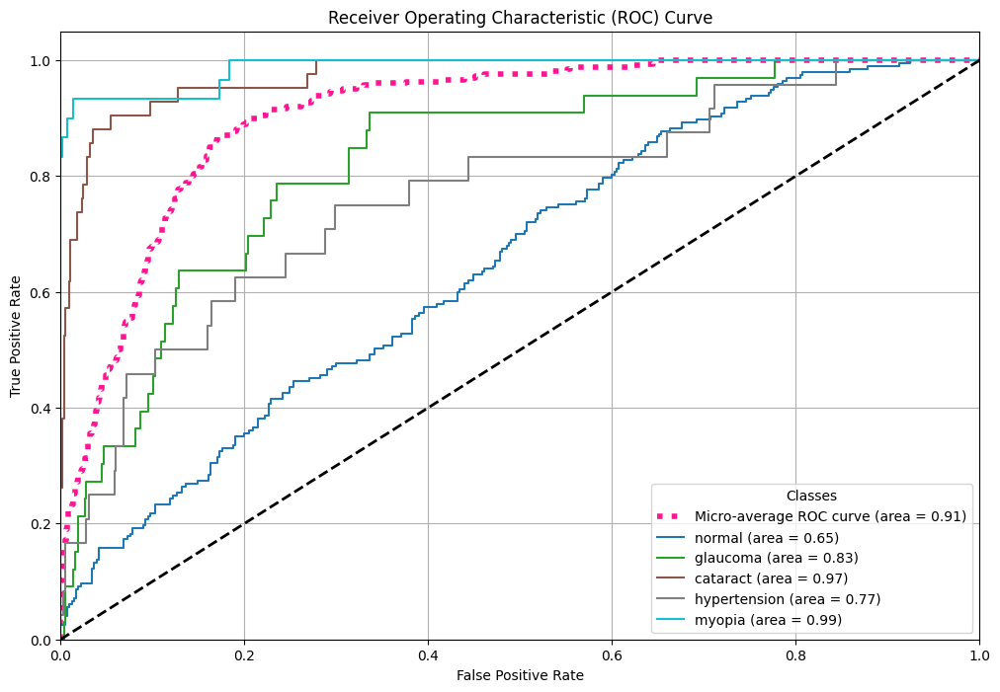

In [36]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Class names for labels
class_names = ['normal', 'glaucoma', 'cataract',
               'hypertension', 'myopia']

# Predict probabilities for the test set
y_pred = model.predict(X_test)

# Compute ROC curve and AUC for each class
n_classes = y_test.shape[1]
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot the micro-average ROC curve
plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC curve (area = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Plot ROC curve for each class
colors = plt.cm.get_cmap("tab10", n_classes)
for i, class_name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             label=f'{class_name} (area = {roc_auc[i]:.2f})')

# Add diagonal line for reference
plt.plot([0, 1], [0, 1], 'k--', lw=2)

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right", title="Classes")
plt.grid()
plt.show()


# Gradcam

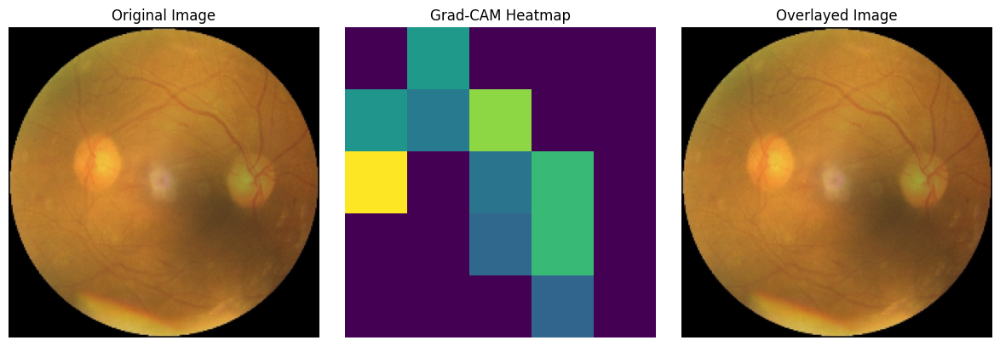

Grad-CAM for Class Index: 0


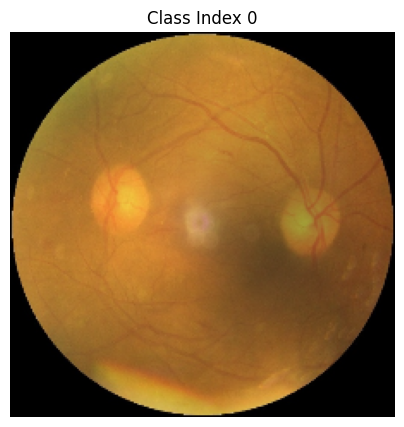

Grad-CAM for Class Index: 1


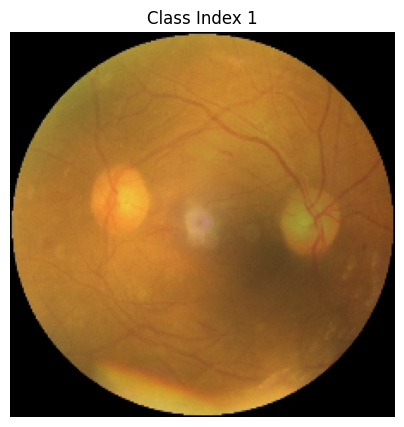

Grad-CAM for Class Index: 2


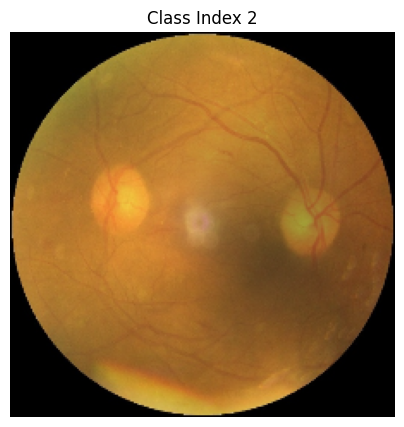

Grad-CAM for Class Index: 3


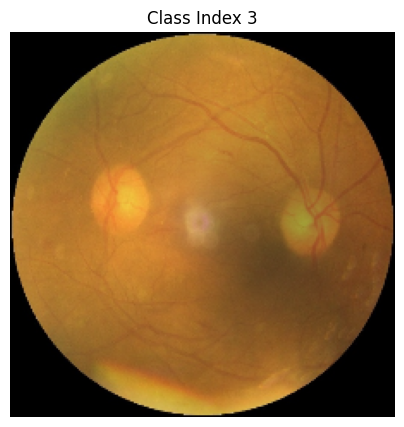

Grad-CAM for Class Index: 4


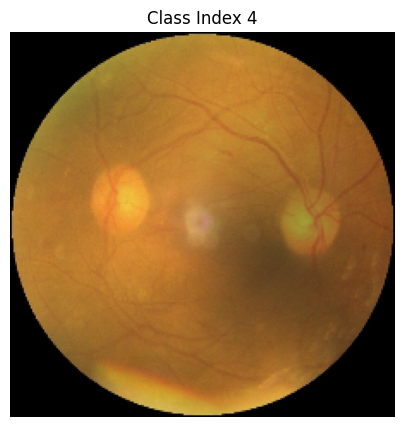

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Load your dataset (replace with your actual data loading code)
# Assuming X_train, y_train, X_test, y_test are already loaded and preprocessed
# And 'labels' variable is defined, representing your label array

# Reconstruct your model (assuming 'labels' variable is available)
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling to reduce dimensions
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)  # L2 regularization
x = Dropout(0.5)(x)  # Increased Dropout for regularization
output_layer = Dense(y_train.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the earlier base model layers for transfer learning
for layer in base_model.layers[:-20]:  # Fine-tune the last 20 layers
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# (Optional) Train the model if not already trained
# Assuming 'datagen' is your ImageDataGenerator and callbacks are defined
# history = model.fit(...)

# Now, proceed to generate Grad-CAM visualizations

# Define the Grad-CAM functions
def get_gradcam_heatmap(model, image, class_index, last_conv_layer_name):
    """
    Generates Grad-CAM heatmap for a specific class.

    Args:
    - model: Trained Keras model.
    - image: Preprocessed input image (shape: (224, 224, 3)).
    - class_index: Index of the class for which to generate Grad-CAM.
    - last_conv_layer_name: Name of the last convolutional layer in the model.

    Returns:
    - Heatmap: Grad-CAM heatmap for the input image.
    """
    # Ensure all layers are trainable for gradient computation
    for layer in model.layers:
        layer.trainable = True

    # Get the last convolutional layer
    last_conv_layer = model.get_layer(last_conv_layer_name)

    # Create a model that maps the input image to the activations of the last conv layer and predictions
    grad_model = Model(inputs=model.inputs, outputs=[last_conv_layer.output, model.output])

    # Compute the gradient of the class output value with respect to the feature map
    with tf.GradientTape() as tape:
        inputs = tf.cast(np.expand_dims(image, axis=0), tf.float32)
        tape.watch(inputs)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, class_index]

    # Get the gradients of the loss w.r.t the outputs of the last conv layer
    grads = tape.gradient(loss, conv_outputs)

    # If gradients are None, return a zero heatmap
    if grads is None:
        print("Gradients are None, cannot compute Grad-CAM.")
        return np.zeros_like(conv_outputs[0, :, :, 0])

    # Compute the guided gradients
    guided_grads = grads[0]

    # Compute the mean intensity of the gradients over the feature maps
    weights = tf.reduce_mean(guided_grads, axis=(0, 1))

    # Compute the Grad-CAM
    cam = tf.reduce_sum(tf.multiply(weights, conv_outputs[0]), axis=-1)

    # Apply ReLU to the heatmap (only positive contributions)
    heatmap = tf.nn.relu(cam)

    # Normalize the heatmap
    heatmap = heatmap / (tf.reduce_max(heatmap) + tf.keras.backend.epsilon())

    return heatmap.numpy()

def overlay_heatmap(heatmap, image, alpha=0.4, colormap='viridis'):
    """
    Overlays the Grad-CAM heatmap on the original image.

    Args:
    - heatmap: Grad-CAM heatmap.
    - image: Original input image (shape: (224, 224, 3)).
    - alpha: Transparency factor for the heatmap overlay.
    - colormap: Colormap for the heatmap.

    Returns:
    - Overlayed image.
    """
    # Rescale heatmap to range [0, 255]
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap to the heatmap
    colormap = plt.get_cmap(colormap)
    heatmap_colored = colormap(heatmap)
    heatmap_colored = np.delete(heatmap_colored, 3, axis=-1)  # Remove alpha channel

    # Resize heatmap to match the image size
    heatmap_colored = tf.image.resize(heatmap_colored, (image.shape[0], image.shape[1])).numpy()

    # Ensure heatmap_colored is in [0, 1]
    heatmap_colored = heatmap_colored / 255.0

    # Overlay heatmap on the image
    overlayed_image = heatmap_colored * alpha + image  # Assuming image is in [0, 1]
    overlayed_image = np.clip(overlayed_image, 0, 1)

    return overlayed_image

# Example: Visualize Grad-CAM for a single image
# Select an image from your test set
image_index = 0  # Change this to select a different image
input_image = X_test[image_index]  # Assuming images are normalized to [0, 1]
true_label = y_test[image_index]

# Choose the class index (e.g., index of 'Cataract') and last conv layer name
class_index = 3  # Replace with the index corresponding to your class of interest
last_conv_layer_name = 'mixed10'  # For InceptionV3, 'mixed10' is the last convolutional layer

# Generate the Grad-CAM heatmap
heatmap = get_gradcam_heatmap(model, input_image, class_index, last_conv_layer_name)

# Overlay the heatmap on the original image
overlayed_image = overlay_heatmap(heatmap, input_image)

# Plot the original image, heatmap, and overlay
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(input_image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap='viridis')
plt.title('Grad-CAM Heatmap')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title('Overlayed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# If you want to generate Grad-CAM for all classes
for class_index in range(y_train.shape[1]):  # Assuming y_train.shape[1] is the number of classes
    print(f"Grad-CAM for Class Index: {class_index}")

    # Generate Grad-CAM heatmap
    heatmap = get_gradcam_heatmap(model, input_image, class_index, last_conv_layer_name)

    # Overlay the heatmap on the original image
    overlayed_image = overlay_heatmap(heatmap, input_image)

    # Plot the overlay
    plt.figure(figsize=(5, 5))
    plt.imshow(overlayed_image)
    plt.title(f'Class Index {class_index}')
    plt.axis('off')
    plt.show()


## Resnet 50

In [ ]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB7
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    shear_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator()  # No augmentation for validation

# Create data generators
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=32,
    shuffle=True
)

validation_generator = test_datagen.flow(
    X_test, y_test,
    batch_size=32,
    shuffle=False
)

# Load the ResNet50 base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(labels.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the base model layers (transfer learning)
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Define callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
checkpoint = ModelCheckpoint('resnet50_best_model.keras',  # Changed extension here
                             monitor='val_loss',
                             save_best_only=True,
                             verbose=1)


# Define training parameters
batch_size = 32
epochs = 20

# Fit the model
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=validation_generator,
    validation_steps=len(X_test) // batch_size,
    epochs=epochs,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

# Evaluate the model
loss, accuracy = model.evaluate(validation_generator, steps=len(X_test) // batch_size)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - accuracy: 0.2410 - loss: 0.5793
Epoch 1: val_loss improved from inf to 0.40704, saving model to resnet50_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 45s 411ms/step - accuracy: 0.2418 - loss: 0.5781 - val_accuracy: 0.3368 - val_loss: 0.4070 - learning_rate: 1.0000e-04
Epoch 2/20
 1/75 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4062 - loss: 0.3563

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss improved from 0.40704 to 0.40092, saving model to resnet50_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - accuracy: 0.4062 - loss: 0.3563 - val_accuracy: 0.4516 - val_loss: 0.4009 - learning_rate: 1.0000e-04
Epoch 3/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.3360 - loss: 0.3753
Epoch 3: val_loss improved from 0.40092 to 0.36567, saving model to resnet50_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 25s 299ms/step - accuracy: 0.3361 - loss: 0.3752 - val_accuracy: 0.3368 - val_loss: 0.3657 - learning_rate: 1.0000e-04
Epoch 4/20
 1/75 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.3125 - loss: 0.3441
Epoch 4: val_loss improved from 0.36567 to 0.36290, saving model to resnet50_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.3125 - loss: 0.3441 - val_accuracy: 0.4516 - val_loss: 0.3629 - learning_rate: 1.0000e-04
Epoch 5/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.3409 - loss: 0.3618
Epoch 5: val_loss did not 

In [ ]:
# Predict probabilities for the test set
y_pred = model.predict(X_test)

# Compute ROC curve and AUC for each class
n_classes = y_test.shape[1]
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot the micro-average ROC curve
plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC curve (area = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Plot ROC curve for each class
colors = plt.cm.get_cmap("tab10", n_classes)
for i, class_name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             label=f'{class_name} (area = {roc_auc[i]:.2f})')

# Add diagonal line for reference
plt.plot([0, 1], [0, 1], 'k--', lw=2)

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Resnet50')
plt.legend(loc="lower right", title="Classes")
plt.grid()
plt.show()


## Efficiency Net

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Split the data (if not already done)
# X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator()  # No augmentation for validation

# Create data generators
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=32,
    shuffle=True
)

validation_generator = test_datagen.flow(
    X_test, y_test,
    batch_size=32,
    shuffle=False
)

# Load the EfficientNetB7 base model
base_model = EfficientNetB7(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(y_train.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the base model layers (transfer learning)
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define Callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

checkpoint = ModelCheckpoint(
    'efficientnetb7_best_model.keras',  # Use .keras extension
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Define training parameters
batch_size = 32
epochs = 20

# Fit the model
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=validation_generator,
    validation_steps=len(X_test) // batch_size,
    epochs=epochs,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

# Evaluate the model
loss, accuracy = model.evaluate(
    validation_generator,
    steps=len(X_test) // batch_size
)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

# Optional: Fine-Tuning
# Unfreeze some layers in the base model
for layer in base_model.layers[-50:]:  # Unfreeze the last 50 layers
    layer.trainable = True

# Re-compile the model with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define Fine-Tuning Callbacks
checkpoint_ft = ModelCheckpoint(
    'efficientnetb7_finetuned_best_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Continue Training (Fine-Tuning)
history_finetune = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=validation_generator,
    validation_steps=len(X_test) // batch_size,
    epochs=10,  # Additional epochs for fine-tuning
    callbacks=[early_stop, reduce_lr, checkpoint_ft]
)

# Evaluate the fine-tuned model
loss_ft, accuracy_ft = model.evaluate(
    validation_generator,
    steps=len(X_test) // batch_size
)
print(f"Fine-Tuned Test Loss: {loss_ft}, Fine-Tuned Test Accuracy: {accuracy_ft}")


258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 839ms/step - accuracy: 0.2539 - loss: 0.5230
Epoch 1: val_loss improved from inf to 0.59997, saving model to efficientnetb7_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - accuracy: 0.2542 - loss: 0.5224 - val_accuracy: 0.3368 - val_loss: 0.6000 - learning_rate: 1.0000e-04
Epoch 2/20
 1/75 ━━━━━━━━━━━━━━━━━━━━ 21s 290ms/step - accuracy: 0.2500 - loss: 0.3853
Epoch 2: val_loss improved from 0.59997 to 0.59569, saving model to efficientnetb7_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - accuracy: 0.2500 - loss: 0.3853 - val_accuracy: 0.4516 - val_loss: 0.5957 - learning_rate: 1.0000e-04
Epoch 3/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - accuracy: 0.3251 - loss: 0.4325
Epoch 3: val_loss did not improve from 0.59569
75/75 ━━━━━━━━━━━━━━━━━━━━ 28s 348ms/step - accuracy: 0.3249 - loss: 0.4325 - val_accuracy: 0.3368 - val_loss: 0.6057 - learning_rate: 1.0000e-04
Epoch 4/2

## DenseNet

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121, DenseNet169
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Split the data (if not already done)
# X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    shear_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator()  # No augmentation for validation

# Create data generators
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=32,
    shuffle=True
)

validation_generator = test_datagen.flow(
    X_test, y_test,
    batch_size=32,
    shuffle=False
)

# Load the DenseNet121 base model (or DenseNet169)
base_model = DenseNet121(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(y_train.shape[1], activation='sigmoid')(x)  # Multi-label classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=output_layer)

# Freeze the base model layers (transfer learning)
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define Callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

checkpoint = ModelCheckpoint(
    'densenet121_best_model.keras',  # Use .keras extension
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Define training parameters
batch_size = 32
epochs = 100

# Fit the model
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=validation_generator,
    validation_steps=len(X_test) // batch_size,
    epochs=epochs,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

# Evaluate the model
loss, accuracy = model.evaluate(
    validation_generator,
    steps=len(X_test) // batch_size
)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

# Optional: Fine-Tuning
# Unfreeze some layers in the base model
for layer in base_model.layers[-50:]:  # Unfreeze the last 50 layers
    layer.trainable = True

# Re-compile the model with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define Fine-Tuning Callbacks
checkpoint_ft = ModelCheckpoint(
    'densenet121_finetuned_best_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Continue Training (Fine-Tuning)
history_finetune = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    validation_data=validation_generator,
    validation_steps=len(X_test) // batch_size,
    epochs=10,  # Additional epochs for fine-tuning
    callbacks=[early_stop, reduce_lr, checkpoint_ft]
)

# Evaluate the fine-tuned model
loss_ft, accuracy_ft = model.evaluate(
    validation_generator,
    steps=len(X_test) // batch_size
)
print(f"Fine-Tuned Test Loss: {loss_ft}, Fine-Tuned Test Accuracy: {accuracy_ft}")


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.2106 - loss: 0.5719
Epoch 1: val_loss improved from inf to 0.36850, saving model to densenet121_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 52s 456ms/step - accuracy: 0.2113 - loss: 0.5707 - val_accuracy: 0.4149 - val_loss: 0.3685 - learning_rate: 1.0000e-04
Epoch 2/100
 1/75 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.3438 - loss: 0.3974

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss improved from 0.36850 to 0.36000, saving model to densenet121_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.3438 - loss: 0.3974 - val_accuracy: 0.3871 - val_loss: 0.3600 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.3821 - loss: 0.3537
Epoch 3: val_loss improved from 0.36000 to 0.33283, saving model to densenet121_best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 25s 300ms/step - accuracy: 0.3824 - loss: 0.3536 - val_accuracy: 0.4444 - val_loss: 0.3328 - learning_rate: 1.0000e-04
Epoch 4/100
 1/75 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.4062 - loss: 0.3643
Epoch 4: val_loss did not improve from 0.33283
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4062 - loss: 0.3643 - val_accuracy: 0.3548 - val_loss: 0.3411 - learning_rate: 1.0000e-04
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.4153 - loss: 0.3294
Epoch 5: val_loss improved from 0.33283 to 0.31201, saving model 

19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 460ms/step


<ipython-input-43-6c917d7f56d6>:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", n_classes)


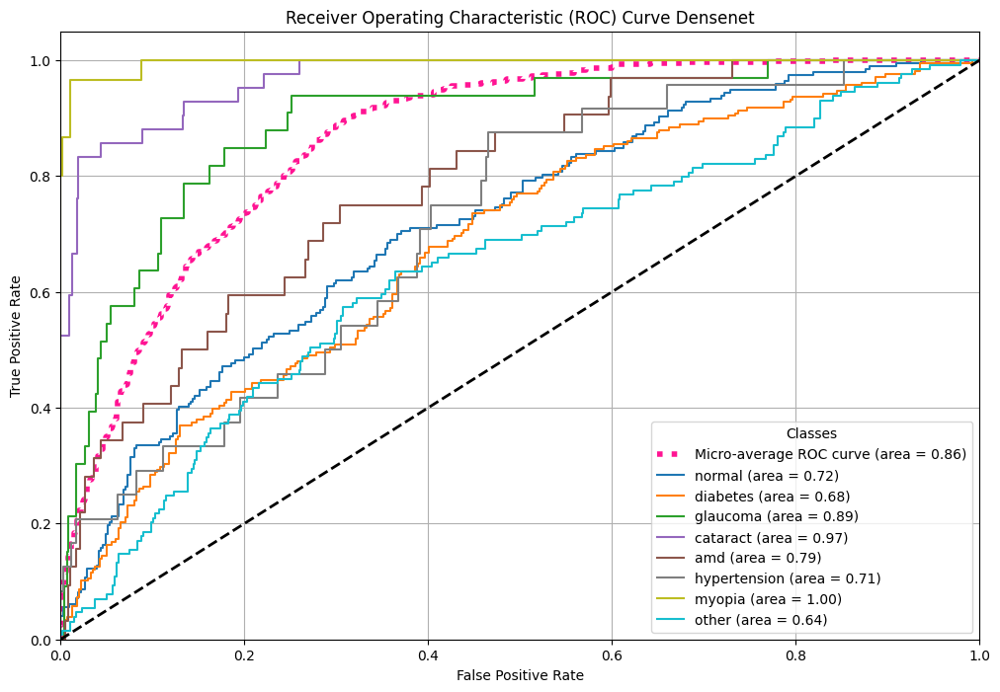

In [ ]:
# Predict probabilities for the test set
y_pred = model.predict(X_test)

# Compute ROC curve and AUC for each class
n_classes = y_test.shape[1]
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot the micro-average ROC curve
plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC curve (area = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Plot ROC curve for each class
colors = plt.cm.get_cmap("tab10", n_classes)
for i, class_name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             label=f'{class_name} (area = {roc_auc[i]:.2f})')

# Add diagonal line for reference
plt.plot([0, 1], [0, 1], 'k--', lw=2)

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Densenet')
plt.legend(loc="lower right", title="Classes")
plt.grid()
plt.show()


# Improved Method

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, InceptionV3, MobileNet, VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization, Input, Concatenate
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split

# Path to the directory containing fundus images
image_path = '/content/drive/MyDrive/Ocular Disease Recognition/preprocessed_images/'
image_dir = image_path

# Verify image existence
def verify_image_paths(df, image_dir):
    missing = []
    for idx, row in df.iterrows():
        left_path = os.path.join(image_dir, row['left_fundus'])
        right_path = os.path.join(image_dir, row['right_fundus'])
        if not os.path.exists(left_path):
            missing.append(left_path)
        if not os.path.exists(right_path):
            missing.append(right_path)
    return missing

missing_images = verify_image_paths(data_df, image_path)
if missing_images:
    print(f"Missing Images ({len(missing_images)}):")
    for img in missing_images[:10]:  # Show first 10 missing images
        print(img)
    # Remove rows with missing images
    data_df = data_df[data_df.apply(lambda row: os.path.exists(os.path.join(image_dir, row['left_fundus'])) and os.path.exists(os.path.join(image_dir, row['right_fundus'])), axis=1)]
    print(f"After removing missing images, dataset size: {len(data_df)}")
else:
    print("All images found.")

# Features and Labels
X_left = data_df['left_fundus'].values
X_right = data_df['right_fundus'].values
y = data_df[['normal', 'diabetes', 'glaucoma', 'cataract', 'amd', 'hypertension', 'myopia', 'other']].values

# Analyze Class Distribution
label_columns = ['normal', 'diabetes', 'glaucoma', 'cataract', 'amd', 'hypertension', 'myopia', 'other']
class_counts = data_df[label_columns].sum()
print("\nInitial Class Distribution:")
print(class_counts)

# Identify classes with less than 2 instances
singleton_classes = class_counts[class_counts < 2].index.tolist()
print(f"\nSingleton or Highly Imbalanced Classes: {singleton_classes}")

# Remove these classes from the labels
if singleton_classes:
    print("\nRemoving singleton or highly imbalanced classes from the dataset...")
    # Drop the singleton classes from the labels
    label_columns_filtered = [col for col in label_columns if col not in singleton_classes]
    y_filtered = data_df[label_columns_filtered].values
    print(f"Filtered Label Columns: {label_columns_filtered}")
else:
    print("\nNo singleton or highly imbalanced classes found.")
    y_filtered = data_df[label_columns].values

# Split the data
X_train_left, X_val_left, X_train_right, X_val_right, y_train, y_val = train_test_split(
    X_left, X_right, y_filtered, test_size=0.3, random_state=42
)

print(f"\nTraining samples: {len(X_train_left)}")
print(f"Validation samples: {len(X_val_left)}")



All images found.

Initial Class Distribution:
normal          1021
diabetes        1018
glaucoma         191
cataract         194
amd              156
hypertension     100
myopia           135
other            683
dtype: int64

Singleton or Highly Imbalanced Classes: []

No singleton or highly imbalanced classes found.

Training samples: 2123
Validation samples: 911
